# Precon exploration

Two related looks at `precon_card_retention` (`edhcut.ingest.precon_retention`):

1. **Weighted cut rate by commander** -- for every precon card, how often real deckbuilders
   keep vs. cut it, split land/nonland, with card-image rows for the extremes.
2. **Precon-effect weighting: raw vs. weighted deck counts** -- how much
   `edhcut.analysis.cooccurrence`'s per-card precon weighting (`precon_card_weight` +
   `deck_precon_trust`) actually changes each card's deck count, compared to a plain
   unweighted count.

No network calls for the data itself (both sections read already-populated tables); card
images do fetch live over the network, through the shared cached `scryfall` session.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
from collections import defaultdict

from edhcut.analysis.cooccurrence import deck_precon_trust, precon_card_weight
from edhcut.config import CONFIG
from edhcut.db import connect
from edhcut.http import get_session
from edhcut.images import get_card_image
from edhcut.ingest.archidekt import slot_key_for
from edhcut.ingest.precon_retention import best_matching_precon

pd.set_option("display.max_colwidth", 60)
pd.set_option("display.max_rows", None)

# Keep the context-manager object itself alive (not just the yielded `conn`) -- otherwise the
# generator-based context manager can get garbage-collected mid-notebook, which runs its own
# `finally: conn.close()` and closes the connection out from under later cells.
_db_ctx = connect(CONFIG.paths.db_path)
conn = _db_ctx.__enter__()

# One shared cached/rate-limited session for every image fetch below, instead of one per call.
img_session = get_session("scryfall")

## 1. Weighted cut rate by commander

Every precon card's *weighted cut rate* (`weighted_cut / (weighted_cut + weighted_kept)`),
split into separate land and nonland bar charts per commander -- lands and spells get cut for
very different reasons, so lumping them together mostly just buries the spells under a wall of
basic lands.

Unlike a plain "was it cut" count, every deck matching that precon's commander(s) contributes
here -- regardless of how much it diverged from the precon -- weighted by
`edhcut.ingest.precon_retention.cut_confidence(diff)`. A deck that barely touched the precon
gives strong evidence about the few cards it *did* cut and weak evidence about the untouched
rest (inertia, not a conscious keep); a heavily rebuilt deck is the mirror image -- weak
evidence per individual cut (everything was in flux anyway) but strong evidence for whatever
specific cards survived a near-total rebuild. No hard similarity cutoff, so even commanders
with very few near-exact-copy decks (or none at all) still get a real signal.

**`weighted_cut + weighted_kept` is the group's effective sample size** (every deck contributes
exactly 1.0 total weight, split between the two) -- shown in each chart title and hover, so a
rate built on a thin precon-commander match doesn't read as more confident than it is.

**Note**: this cut/keep rate is computed independently of section 2 below -- it's the *input*
`precon_card_weight()` consumes, not itself affected by the deck-overlap trust nuance.

In [2]:
def commander_label(conn, commander_key: str) -> str:
    """commander_key is a bare oracle_id for a single commander, \"id1+id2\" for a partner
    pair (same convention as edhrec_card_stats.commander_key) — resolve each half to a name."""
    names = []
    for oracle_id in commander_key.split("+"):
        row = conn.execute("SELECT name FROM cards WHERE oracle_id = ?", (oracle_id,)).fetchone()
        names.append(row[0] if row else oracle_id)
    return " + ".join(names)


df = pd.read_sql_query(
    """
    SELECT r.precon_id, r.commander_key, r.oracle_id, c.name AS card_name, c.is_land,
           r.similar_deck_count, r.kept_count, r.weighted_cut, r.weighted_kept,
           p.deck_name AS precon_name
    FROM precon_card_retention r
    JOIN cards c ON c.oracle_id = r.oracle_id
    JOIN precons p ON p.precon_id = r.precon_id
    """,
    conn,
)
df["weighted_total"] = df["weighted_cut"] + df["weighted_kept"]
df["weighted_cut_rate"] = df["weighted_cut"] / df["weighted_total"]
df["commander_name"] = df["commander_key"].map(lambda k: commander_label(conn, k))
df["is_land"] = df["is_land"].astype(bool)

print(f"{len(df)} rows across {df.groupby(['precon_id', 'commander_key']).ngroups} (precon, commander) group(s).")
df.sort_values("weighted_cut_rate", ascending=False).head(10)

155 rows across 2 (precon, commander) group(s).


,precon_id,commander_key,oracle_id,card_name,is_land,similar_deck_count,kept_count,weighted_cut,weighted_kept,precon_name,weighted_total,weighted_cut_rate,commander_name
14,22357696,68418069-f615-40ef-ae0d-764192acae00,4c340b82-22e1-445a-b236-82471b442031,Frontline Heroism,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
52,22357696,68418069-f615-40ef-ae0d-764192acae00,a95a0b13-d50f-41cf-8668-de60d445e7b0,Ancestors' Aid,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
29,22357696,68418069-f615-40ef-ae0d-764192acae00,f17d0fb8-c157-43b8-be26-f5ba4c6aed14,Haze of Rage,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
43,22357696,68418069-f615-40ef-ae0d-764192acae00,bc59977f-b3a7-4bc1-9f20-0a1e36d418ae,Spreading Insurrection,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
44,22357696,68418069-f615-40ef-ae0d-764192acae00,37a18736-5fe2-4897-809b-013497bdd890,Past in Flames,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
76,22357696,68418069-f615-40ef-ae0d-764192acae00,e05abb6b-e9f4-4d9e-ad1e-7805ebc09914,Fists of Flame,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
75,22357696,68418069-f615-40ef-ae0d-764192acae00,61978202-538b-4f92-acfc-e95f4a6ce466,Wild Ride,False,0,0,3.770417,0.000000,Goblin Storm Secret Lair Commander,3.770417,1.000000,"Krenko, Mob Boss"
130,2209041,726cd041-5d0b-436c-bced-9335f56c0b0d,874e0b54-bc24-4887-abe1-1ecfd3a3abae,Trostani's Summoner,False,5,1,9.618066,0.141851,Coven Counters - Midnight Hunt Commander,9.759917,0.985466,"Kyler, Sigardian Emissary"
38,22357696,68418069-f615-40ef-ae0d-764192acae00,ac7d1986-8388-4e4c-973e-d90382b12acf,Sazacap's Brew,False,0,0,3.768850,0.172346,Goblin Storm Secret Lair Commander,3.941195,0.956271,"Krenko, Mob Boss"
69,22357696,68418069-f615-40ef-ae0d-764192acae00,a145ff8c-5812-4bcb-bd16-9839dc25121d,Storm-Kiln Artist,False,0,0,3.767313,0.228780,Goblin Storm Secret Lair Commander,3.996093,0.942749,"Krenko, Mob Boss"


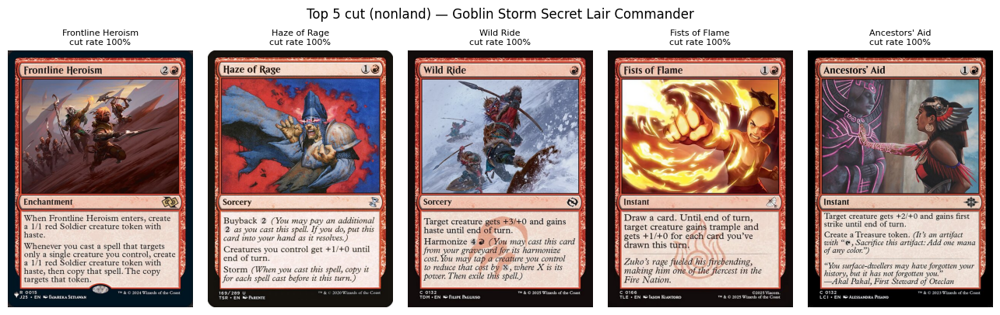

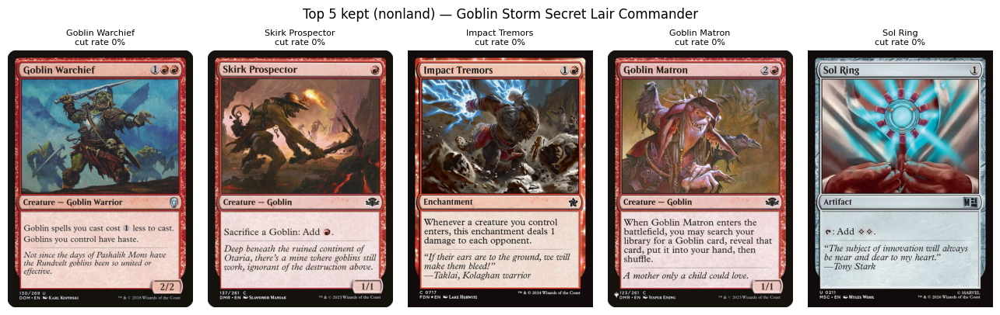

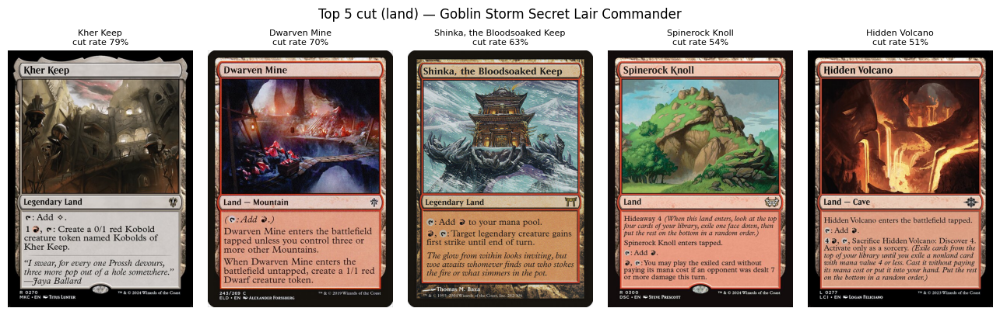

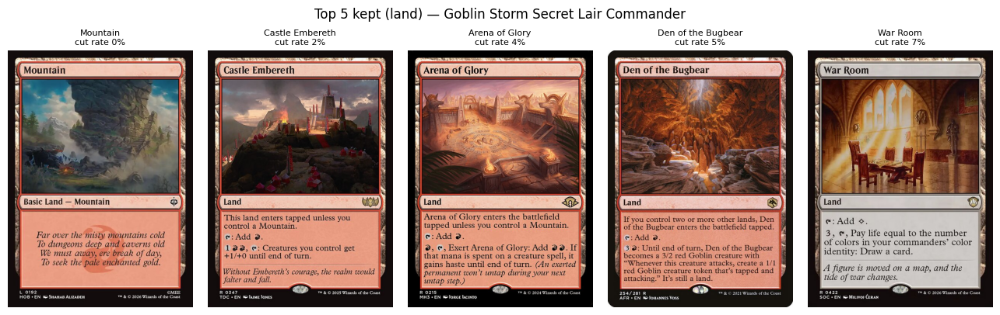

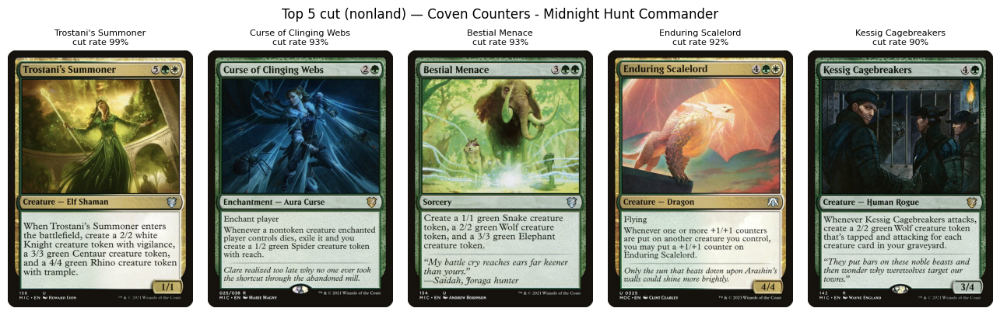

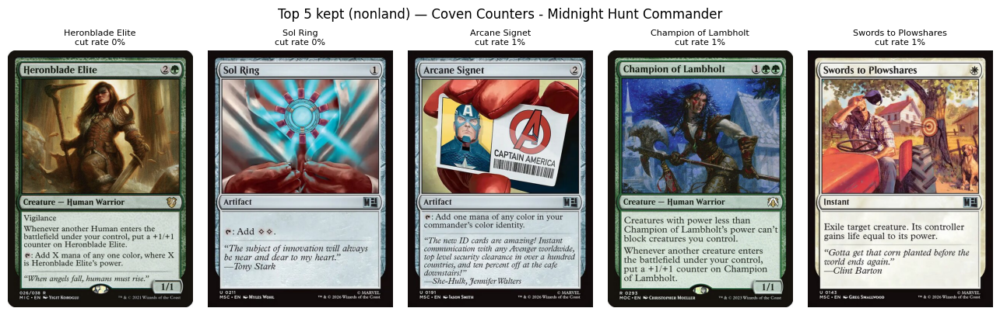

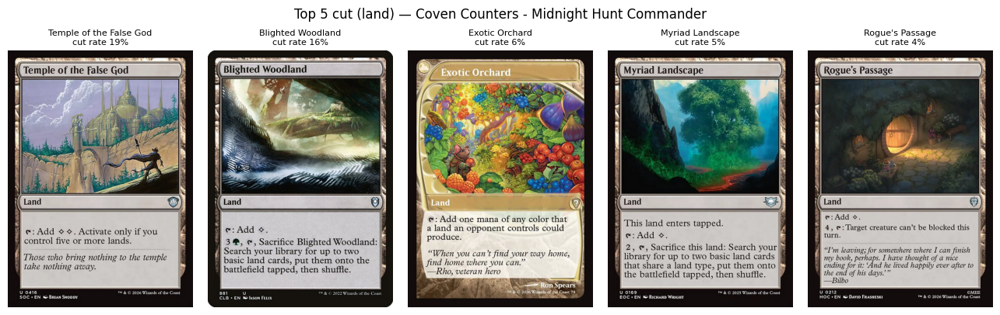

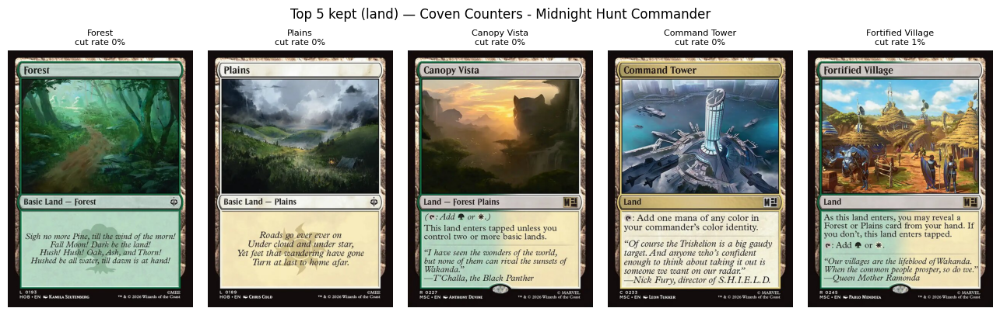

In [3]:
def show_card_row(conn, rows: pd.DataFrame, title: str) -> None:
    """One row of card images (fetched live via edhcut.images.get_card_image) for the given
    precon_card_retention rows, each captioned with its weighted cut rate."""
    n = len(rows)
    if n == 0:
        return
    fig, axes = plt.subplots(1, n, figsize=(2.6 * n, 4.1))
    if n == 1:
        axes = [axes]
    for ax, (_, row) in zip(axes, rows.iterrows()):
        image = get_card_image(conn, row["card_name"], session=img_session)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"{row['card_name']}\ncut rate {row['weighted_cut_rate']:.0%}", fontsize=8)
    fig.suptitle(title, fontsize=12)
    # rect reserves the top ~14% of the figure for the suptitle -- tight_layout() alone doesn't
    # know about fig.suptitle() and will happily let it collide with the per-axes titles above.
    fig.tight_layout(rect=(0, 0, 1, 0.96))
    plt.show()


def render_category(
    sub_group: pd.DataFrame, *, commander_name: str, precon_name: str, effective_n: float, category: str
) -> None:
    """Bar chart + top-5-cut/top-5-kept image rows for one land-or-nonland slice of a
    commander's precon_card_retention rows."""
    if sub_group.empty:
        print(f"No {category} cards tracked for {commander_name}.")
        return
    sorted_sub = sub_group.sort_values("weighted_cut_rate", ascending=False)

    fig = px.bar(
        sorted_sub,
        x="card_name",
        y="weighted_cut_rate",
        hover_data=["weighted_cut", "weighted_kept", "kept_count", "similar_deck_count"],
        title=f"{commander_name} — weighted {category} cut rate in '{precon_name}'",
        subtitle=f"(effective n≈{effective_n:.0f} decks)",
        labels={"weighted_cut_rate": "weighted cut rate", "card_name": ""},
    )
    fig.update_layout(yaxis_tickformat=".0%", xaxis_tickangle=-65, height=450)
    fig.show()

    show_card_row(conn, sorted_sub.head(5), f"Top 5 cut ({category}) — {precon_name}")
    show_card_row(conn, sorted_sub.tail(5).iloc[::-1], f"Top 5 kept ({category}) — {precon_name}")


def render_commander(precon_id, commander_key) -> None:
    group = df[(df["precon_id"] == precon_id) & (df["commander_key"] == commander_key)]
    commander_name = group["commander_name"].iloc[0]
    precon_name = group["precon_name"].iloc[0]
    effective_n = group["weighted_total"].iloc[0]

    render_category(
        group[~group["is_land"]], commander_name=commander_name, precon_name=precon_name,
        effective_n=effective_n, category="nonland",
    )
    render_category(
        group[group["is_land"]], commander_name=commander_name, precon_name=precon_name,
        effective_n=effective_n, category="land",
    )


if df.empty:
    print("No precon_card_retention rows yet — run `python -m edhcut.ingest.precon_retention` first.")

for precon_id, commander_key in df[["precon_id", "commander_key"]].drop_duplicates().itertuples(index=False):
    render_commander(precon_id, commander_key)

## 2. Precon-effect weighting: raw vs. weighted deck counts

For every precon card tracked in `precon_card_retention`, this compares two counts of how many
matched decks include it:

- **raw count**: the plain number of matched decks containing the card -- no down-weighting.
- **weighted count**: `edhcut.analysis.cooccurrence`'s actual per-card precon weight applied --
  `precon_card_weight(cut_rate)` (full weight at <=5% cut rate, linear decay to 0 at 100% cut
  rate), scaled by `deck_precon_trust(diff, deck_total)` for each contributing deck's own
  quantity-aware difference from the precon (0 trust once a deck's shared-card overlap with the
  precon drops to 20 or fewer, 1.0 at a near-exact copy -- i.e. a deck that barely resembles the
  precon contributes close to full weight regardless of the card's own cut rate, since its
  inclusion isn't good evidence of precon inertia).

`weighted count <= raw count` always, since every deck's own contribution is capped at 1.0.
This recomputes both counts by walking every deck that matched a precon, calling the same
`precon_card_weight`/`deck_precon_trust` functions the real pipeline uses -- not a
re-derivation of the formulas.

## Walk every deck, group by (precon, commander)

Same matching `precon_card_retention` itself was built with (`best_matching_precon`), so "which
precon a deck matched" agrees with that table.

In [4]:
matches: dict[int, tuple[int, str, set[str], int, int]] = {}
for deck_id, commander_oracle_id, partner_oracle_id in conn.execute(
    "SELECT deck_id, commander_oracle_id, partner_oracle_id FROM decks"
):
    commander_ids = [oid for oid in (commander_oracle_id, partner_oracle_id) if oid]
    if not commander_ids:
        continue
    deck_cards = dict(
        conn.execute("SELECT oracle_id, qty FROM deck_cards WHERE deck_id = ?", (deck_id,)).fetchall()
    )
    match = best_matching_precon(conn, deck_cards, commander_ids)
    if match is None:
        continue
    precon_id, diff = match
    commander_key = slot_key_for(commander_ids)
    # Quantity-aware total (sum of qty, not distinct-card count) -- same convention
    # `deck_precon_trust`/`_precon_card_weight_overrides` use in production.
    deck_total = sum(deck_cards.values())
    matches[deck_id] = (precon_id, commander_key, set(deck_cards.keys()), diff, deck_total)

groups: dict[tuple[int, str], list[tuple[int, set[str], int, int]]] = defaultdict(list)
for deck_id, (precon_id, commander_key, cardset, diff, deck_total) in matches.items():
    groups[(precon_id, commander_key)].append((deck_id, cardset, diff, deck_total))

print(f"{len(matches)} decks matched some precon, across {len(groups)} (precon, commander) group(s)")

601 decks matched some precon, across 2 (precon, commander) group(s)


## Raw vs. weighted count per precon card

For each group's tracked cards (that have a `precon_card_retention` cut rate), sum each
contributing deck's own trust-scaled weight.

In [5]:
records = []
for (precon_id, commander_key), deck_list in groups.items():
    own_commanders = set(commander_key.split("+"))
    tracked = {
        oid for (oid,) in conn.execute(
            "SELECT oracle_id FROM precon_cards WHERE precon_id = ?", (precon_id,)
        )
        if oid not in own_commanders
    }
    cut_rates = {}
    for oracle_id, weighted_cut, weighted_kept in conn.execute(
        "SELECT oracle_id, weighted_cut, weighted_kept FROM precon_card_retention "
        "WHERE precon_id = ? AND commander_key = ?",
        (precon_id, commander_key),
    ):
        total = weighted_cut + weighted_kept
        if total > 0:
            cut_rates[oracle_id] = weighted_cut / total

    # Trust depends on the deck's own (diff, deck_total) against its matched precon -- same
    # inputs production `_precon_card_weight_overrides` uses -- not on which card is being
    # scored, so compute once per deck and reuse for every card below.
    deck_trust = {
        deck_id: deck_precon_trust(diff, deck_total)
        for deck_id, cardset, diff, deck_total in deck_list
    }

    precon_name = conn.execute(
        "SELECT deck_name FROM precons WHERE precon_id = ?", (precon_id,)
    ).fetchone()[0]

    for oracle_id in tracked:
        if oracle_id not in cut_rates:
            continue
        raw_weight = precon_card_weight(cut_rates[oracle_id])
        raw_count = 0
        weighted_count = 0.0
        for deck_id, cardset, diff, deck_total in deck_list:
            if oracle_id not in cardset:
                continue
            raw_count += 1
            weighted_count += 1.0 - deck_trust[deck_id] * (1.0 - raw_weight)
        if raw_count == 0:
            continue
        records.append({
            "precon": precon_name,
            "commander_key": commander_key,
            "oracle_id": oracle_id,
            "cut_rate": cut_rates[oracle_id],
            "raw_count": raw_count,
            "weighted_count": weighted_count,
        })

df = pd.DataFrame(records)
name_by_oid = dict(conn.execute("SELECT oracle_id, name FROM cards").fetchall())
df["name"] = df["oracle_id"].map(name_by_oid)
df = df.sort_values("cut_rate").reset_index(drop=True)

print(f"{len(df)} precon cards")
df.head()

148 precon cards


,precon,commander_key,oracle_id,cut_rate,raw_count,weighted_count,name
0,Coven Counters - Midnight Hunt Commander,726cd041-5d0b-436c-bced-9335f56c0b0d,b34bb2dc-c1af-4d77-b0b3-a0fb342a5fc6,0.000005,291,291.0,Forest
1,Goblin Storm Secret Lair Commander,68418069-f615-40ef-ae0d-764192acae00,a3fb7228-e76b-4e96-a40e-20b5fed75685,0.000042,286,286.0,Mountain
2,Coven Counters - Midnight Hunt Commander,726cd041-5d0b-436c-bced-9335f56c0b0d,bc71ebf6-2056-41f7-be35-b2e5c34afa99,0.000093,291,291.0,Plains
3,Goblin Storm Secret Lair Commander,68418069-f615-40ef-ae0d-764192acae00,39882df0-c20f-469d-94ba-1617224e71a1,0.000618,288,288.0,Goblin Warchief
4,Coven Counters - Midnight Hunt Commander,726cd041-5d0b-436c-bced-9335f56c0b0d,e3e255e0-ab04-4488-bdc1-bb1542f51e16,0.000816,274,274.0,Heronblade Elite


## Bar charts: raw count vs. weighted count, per card

Same 155-card order (sorted by cut rate ascending) on both charts, so the shape difference is
directly comparable. Colored by which (precon, commander) group the card belongs to.

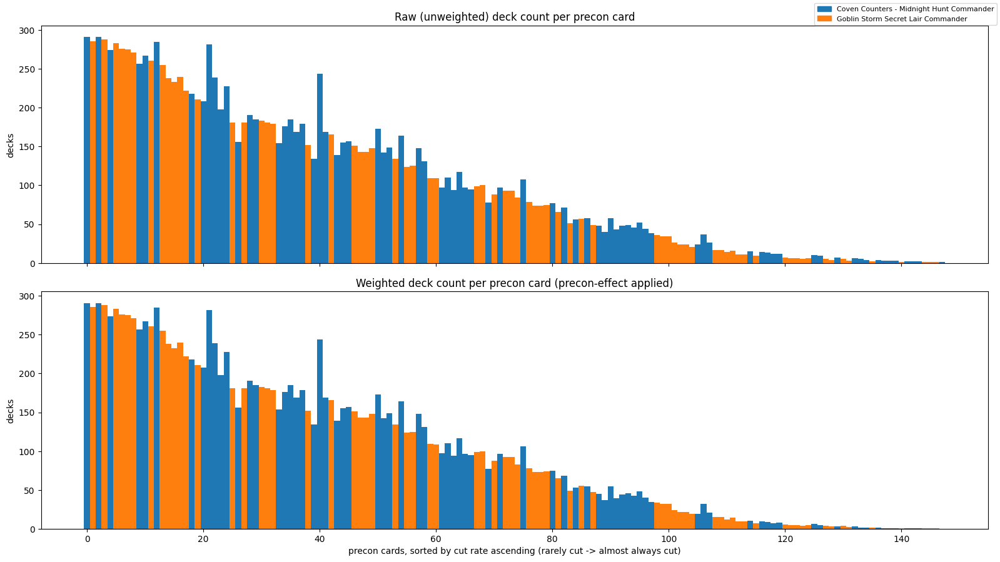

In [6]:
groups_list = sorted(df["precon"].unique())
colors = dict(zip(groups_list, plt.cm.tab10.colors))
bar_colors = df["precon"].map(colors)
x = np.arange(len(df))

fig, axes = plt.subplots(2, 1, figsize=(16, 9), sharex=True)

axes[0].bar(x, df["raw_count"], color=bar_colors, width=1.0)
axes[0].set_title("Raw (unweighted) deck count per precon card")
axes[0].set_ylabel("decks")

axes[1].bar(x, df["weighted_count"], color=bar_colors, width=1.0)
axes[1].set_title("Weighted deck count per precon card (precon-effect applied)")
axes[1].set_ylabel("decks")
axes[1].set_xlabel("precon cards, sorted by cut rate ascending (rarely cut -> almost always cut)")

handles = [plt.Rectangle((0, 0), 1, 1, color=colors[g]) for g in groups_list]
fig.legend(handles, groups_list, loc="upper right", fontsize=8)
fig.tight_layout()
plt.show()

## Box plot: raw vs. weighted count distributions

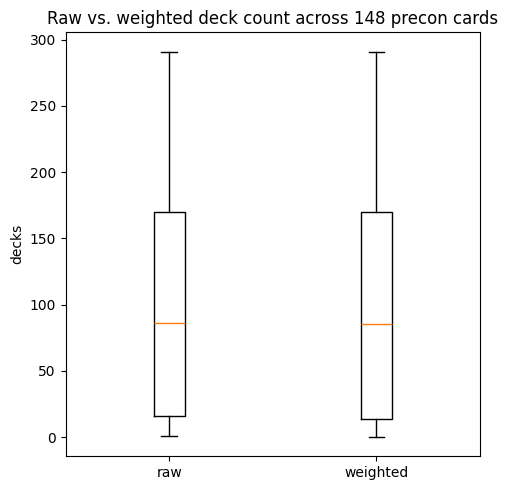

        raw_count  weighted_count
count  148.000000      148.000000
mean   103.716216      102.475856
std     90.823522       91.839126
min      1.000000        0.015299
25%     15.750000       13.533922
50%     86.000000       85.244230
75%    170.000000      170.000000
max    291.000000      291.000000


In [7]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.boxplot([df["raw_count"], df["weighted_count"]], tick_labels=["raw", "weighted"])
ax.set_ylabel("decks")
ax.set_title(f"Raw vs. weighted deck count across {len(df)} precon cards")
fig.tight_layout()
plt.show()

print(df[["raw_count", "weighted_count"]].describe())

## Most affected cards

Biggest gap between raw and weighted count -- these are the cards the precon-effect weighting
changes the most.

In [8]:
df["reduction"] = df["raw_count"] - df["weighted_count"]
df.sort_values("reduction", ascending=False)[
    ["name", "precon", "cut_rate", "raw_count", "weighted_count", "reduction"]
].head(15)

,name,precon,cut_rate,raw_count,weighted_count,reduction
106,Orzhov Advokist,Coven Counters - Midnight Hunt Commander,0.340579,37,31.853357,5.146643
114,Hour of Reckoning,Coven Counters - Midnight Hunt Commander,0.516331,15,10.055677,4.944323
107,Biogenic Upgrade,Coven Counters - Midnight Hunt Commander,0.344719,26,21.112749,4.887251
116,Gyre Sage,Coven Counters - Midnight Hunt Commander,0.544547,14,9.179015,4.820985
118,Custodi Soulbinders,Coven Counters - Midnight Hunt Commander,0.589970,12,7.238713,4.761287
117,Ainok Bond-Kin,Coven Counters - Midnight Hunt Commander,0.583051,13,8.291590,4.708410
105,Celestial Judgment,Coven Counters - Midnight Hunt Commander,0.329658,24,19.319835,4.680165
119,Moonsilver Key,Coven Counters - Midnight Hunt Commander,0.612464,12,7.452235,4.547765
126,Growth Spasm,Coven Counters - Midnight Hunt Commander,0.671510,9,4.752304,4.247696
125,Sigarda's Vanguard,Coven Counters - Midnight Hunt Commander,0.671272,10,5.829754,4.170246


## 3. Precon-adjacent vs. non-adjacent decks: which cards skew outside the box

Different question from section 2: instead of down-weighting individual card instances, split
*decks* into two buckets and compare raw inclusion counts between them.

For a single commander (Kyler, as requested), take **every** deck running that commander (not
just ones already close enough to count as evidence in `precon_card_retention`) and classify
each one against Kyler's own matched precon ("Coven Counters"):

- **precon-adjacent**: shares at least 50% of the precon's own (commander-excluded) card list,
  quantity-aware (`multiset_overlap`, same helper `precon_retention.py` uses elsewhere) --
  i.e. `overlap / precon_total >= 0.5`.
- **non-adjacent**: everything else.

For each precon-tracked card, `ratio = (# non-adjacent decks running it) / (# adjacent decks
running it)`. Cards with `adjacent_count == 0` have an undefined ratio and are excluded (flagged
below if any). No normalization for the pool sizes being unequal -- the raw counts are shown
alongside the ratio so that's visible directly.

In [9]:
from edhcut.ingest.precon_retention import multiset_overlap

COMMANDER_NAME = "Kyler, Sigardian Emissary"
ADJACENCY_THRESHOLD = 0.5

commander_id = conn.execute(
    "SELECT oracle_id FROM cards WHERE name = ?", (COMMANDER_NAME,)
).fetchone()[0]

# Same convention as sections 1-2: "the precon" for a commander is whichever precon_id already
# shows up for it in precon_card_retention (built from each deck's own best match).
precon_row = conn.execute(
    "SELECT DISTINCT precon_id FROM precon_card_retention WHERE commander_key = ?", (commander_id,)
).fetchall()
assert len(precon_row) == 1, f"expected exactly one precon for {COMMANDER_NAME}, got {precon_row}"
precon_id = precon_row[0][0]
precon_name = conn.execute(
    "SELECT deck_name FROM precons WHERE precon_id = ?", (precon_id,)
).fetchone()[0]

precon_cards = {
    oracle_id: qty
    for oracle_id, qty in conn.execute(
        "SELECT oracle_id, qty FROM precon_cards WHERE precon_id = ?", (precon_id,)
    )
    if oracle_id != commander_id
}
precon_total = sum(precon_cards.values())

print(f"{COMMANDER_NAME} -> precon '{precon_name}' ({precon_total} tracked physical cards, "
      f"{len(precon_cards)} distinct)")

Kyler, Sigardian Emissary -> precon 'Coven Counters - Midnight Hunt Commander' (99 tracked physical cards, 77 distinct)


In [10]:
# Every deck running this commander, not scoped to precon_card_retention's own diff-based
# evidence pool -- classified purely by the 50% overlap-fraction rule above.
deck_rows = conn.execute(
    "SELECT deck_id FROM decks WHERE commander_oracle_id = ? AND partner_oracle_id IS NULL",
    (commander_id,),
).fetchall()

adjacent_decks: list[tuple[int, set[str]]] = []
nonadjacent_decks: list[tuple[int, set[str]]] = []
for (deck_id,) in deck_rows:
    deck_cards = dict(
        conn.execute("SELECT oracle_id, qty FROM deck_cards WHERE deck_id = ?", (deck_id,)).fetchall()
    )
    fraction = multiset_overlap(deck_cards, precon_cards) / precon_total
    bucket = adjacent_decks if fraction >= ADJACENCY_THRESHOLD else nonadjacent_decks
    bucket.append((deck_id, set(deck_cards.keys())))

print(
    f"{len(deck_rows)} {COMMANDER_NAME} decks total: {len(adjacent_decks)} precon-adjacent "
    f"(>= {ADJACENCY_THRESHOLD:.0%} shared with '{precon_name}'), {len(nonadjacent_decks)} not"
)

300 Kyler, Sigardian Emissary decks total: 80 precon-adjacent (>= 50% shared with 'Coven Counters - Midnight Hunt Commander'), 220 not


In [11]:
ratio_records = []
undefined_cards = 0
for oracle_id in precon_cards:
    adjacent_count = sum(1 for _, cardset in adjacent_decks if oracle_id in cardset)
    nonadjacent_count = sum(1 for _, cardset in nonadjacent_decks if oracle_id in cardset)
    if adjacent_count == 0:
        undefined_cards += 1
        continue
    ratio_records.append({
        "oracle_id": oracle_id,
        "adjacent_count": adjacent_count,
        "nonadjacent_count": nonadjacent_count,
        "ratio": nonadjacent_count / adjacent_count,
    })

ratio_df = pd.DataFrame(ratio_records)
card_info = pd.read_sql_query("SELECT oracle_id, name, is_land FROM cards", conn).set_index("oracle_id")
ratio_df["name"] = ratio_df["oracle_id"].map(card_info["name"])
ratio_df["is_land"] = ratio_df["oracle_id"].map(card_info["is_land"]).astype(bool)

n_lands = int(ratio_df["is_land"].sum())
ratio_df = ratio_df[~ratio_df["is_land"]].sort_values("ratio", ascending=False).reset_index(drop=True)

print(f"{len(ratio_df) + undefined_cards + n_lands} precon cards total: {n_lands} lands filtered out, "
      f"{undefined_cards} excluded (0 adjacent decks containing them), "
      f"{len(ratio_df)} nonland cards with a defined ratio shown below")

top5 = ratio_df.head(5)
ratio_df[["name", "adjacent_count", "nonadjacent_count", "ratio"]]

77 precon cards total: 15 lands filtered out, 0 excluded (0 adjacent decks containing them), 62 nonland cards with a defined ratio shown below


,name,adjacent_count,nonadjacent_count,ratio
0,Avacyn's Pilgrim,63,181,2.873016
1,Champion of Lambholt,79,203,2.569620
2,Sol Ring,77,190,2.467532
3,Heronblade Elite,80,194,2.425000
4,Swords to Plowshares,73,166,2.273973
5,Arcane Signet,72,146,2.027778
6,Beast Within,57,107,1.877193
7,Bastion Protector,68,123,1.808824
8,Eternal Witness,66,119,1.803030
9,Somberwald Sage,72,126,1.750000


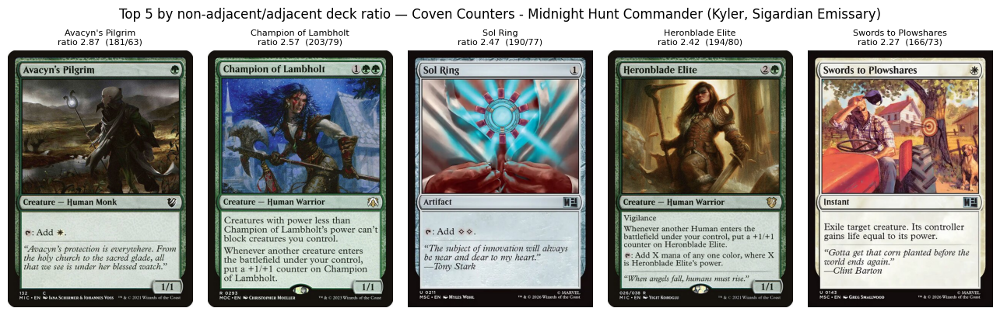

In [12]:
def show_ratio_row(conn, rows: pd.DataFrame, title: str) -> None:
    n = len(rows)
    if n == 0:
        return
    fig, axes = plt.subplots(1, n, figsize=(2.6 * n, 4.1))
    if n == 1:
        axes = [axes]
    for ax, (_, row) in zip(axes, rows.iterrows()):
        image = get_card_image(conn, row["name"], session=img_session)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(
            f"{row['name']}\nratio {row['ratio']:.2f}  ({row['nonadjacent_count']}/{row['adjacent_count']})",
            fontsize=8,
        )
    fig.suptitle(title, fontsize=12)
    fig.tight_layout(rect=(0, 0, 1, 0.96))
    plt.show()


show_ratio_row(
    conn, top5,
    f"Top 5 by non-adjacent/adjacent deck ratio — {precon_name} ({COMMANDER_NAME})",
)

## 4. Comparing the two orderings: weighted cut rate vs. non-adjacent/adjacent ratio

Section 1's weighted cut rate and section 3's ratio come from different inputs (trust-weighted
cut/kept evidence restricted to decks within `DIFF_THRESHOLD`, vs. a raw deck count split by
the 50% overlap rule across *every* Kyler deck) but should point the same direction if they're
both tracking real card quality: a card kept a lot (low cut rate) should also show up
disproportionately in decks that don't resemble the precon (high ratio), and vice versa.

Ranked by cut rate ascending (1 = kept the most) vs. ranked by ratio descending (1 = most
skewed toward non-adjacent decks) -- `rank_diff` is the absolute gap between those two rank
positions for the same card.

In [13]:
from scipy.stats import spearmanr

cutrate_rows = conn.execute(
    """
    SELECT r.oracle_id, c.is_land, r.weighted_cut, r.weighted_kept
    FROM precon_card_retention r JOIN cards c ON c.oracle_id = r.oracle_id
    WHERE r.precon_id = ? AND r.commander_key = ?
    """,
    (precon_id, commander_id),
)
cutrate_df = pd.DataFrame(cutrate_rows, columns=["oracle_id", "is_land", "weighted_cut", "weighted_kept"])
cutrate_df["weighted_cut_rate"] = cutrate_df["weighted_cut"] / (
    cutrate_df["weighted_cut"] + cutrate_df["weighted_kept"]
)
cutrate_df = cutrate_df[~cutrate_df["is_land"].astype(bool)]

# Inner join -- only cards with both a defined ratio (section 3) and a nonzero cut/kept total
# (section 1) are comparable. Same 62 nonland cards in practice.
compare_df = ratio_df.merge(cutrate_df[["oracle_id", "weighted_cut_rate"]], on="oracle_id", how="inner")
compare_df["rank_cutrate"] = compare_df["weighted_cut_rate"].rank(method="min")
compare_df["rank_ratio"] = compare_df["ratio"].rank(ascending=False, method="min")
compare_df["rank_diff"] = (compare_df["rank_cutrate"] - compare_df["rank_ratio"]).abs()

rho, p_value = spearmanr(compare_df["weighted_cut_rate"], compare_df["ratio"])
print(f"{len(compare_df)} cards compared. Spearman correlation (cut rate vs. ratio): "
      f"rho={rho:.3f} (p={p_value:.2e})")
print("(negative rho is the expected direction: low cut rate <-> high ratio)")

62 cards compared. Spearman correlation (cut rate vs. ratio): rho=-0.936 (p=5.64e-29)
(negative rho is the expected direction: low cut rate <-> high ratio)


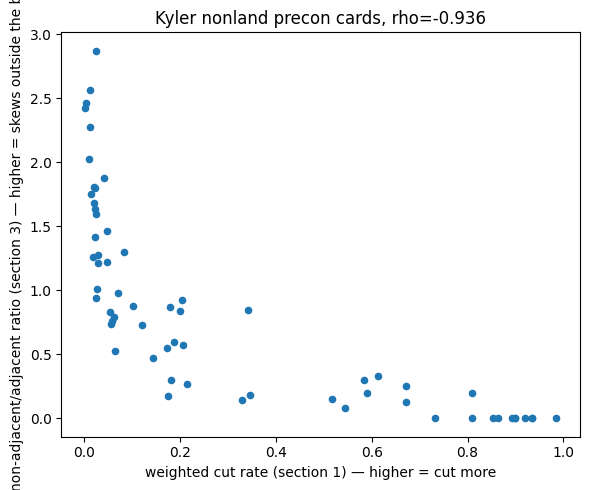

In [14]:
fig, ax = plt.subplots(figsize=(6, 5))
ax.scatter(compare_df["weighted_cut_rate"], compare_df["ratio"], s=20)
ax.set_xlabel("weighted cut rate (section 1) — higher = cut more")
ax.set_ylabel("non-adjacent/adjacent ratio (section 3) — higher = skews outside the box")
ax.set_title(f"Kyler nonland precon cards, rho={rho:.3f}")
fig.tight_layout()
plt.show()

### Biggest disagreements between the two orderings

Full table, sorted by `rank_diff` descending.

In [15]:
compare_df.sort_values("rank_diff", ascending=False)[
    ["name", "weighted_cut_rate", "rank_cutrate", "ratio", "rank_ratio", "rank_diff"]
].reset_index(drop=True)

,name,weighted_cut_rate,rank_cutrate,ratio,rank_ratio,rank_diff
0,Orzhov Advokist,0.340579,42.0,0.850000,27.0,15.0
1,Yavimaya Elder,0.204654,38.0,0.925926,24.0,14.0
2,Celebrate the Harvest,0.174676,33.0,0.176471,47.0,14.0
3,Avacyn's Pilgrim,0.024099,14.0,2.873016,1.0,13.0
4,Beast Within,0.040951,19.0,1.877193,7.0,12.0
5,Knight of the White Orchid,0.081743,28.0,1.297872,16.0,12.0
6,Lifecrafter's Bestiary,0.064314,26.0,0.529412,37.0,11.0
7,"Sigarda, Heron's Grace",0.018229,7.0,1.260870,18.0,11.0
8,Inspiring Call,0.023891,13.0,0.942029,23.0,10.0
9,Trostani's Summoner,0.985466,62.0,0.000000,52.0,10.0


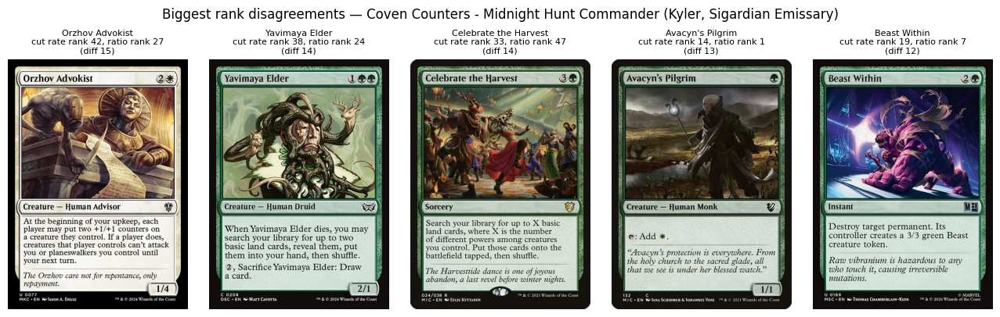

In [16]:
def show_mismatch_row(conn, rows: pd.DataFrame, title: str) -> None:
    n = len(rows)
    if n == 0:
        return
    fig, axes = plt.subplots(1, n, figsize=(2.6 * n, 4.1))
    if n == 1:
        axes = [axes]
    for ax, (_, row) in zip(axes, rows.iterrows()):
        image = get_card_image(conn, row["name"], session=img_session)
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(
            f"{row['name']}\ncut rate rank {row['rank_cutrate']:.0f}, ratio rank {row['rank_ratio']:.0f}"
            f"\n(diff {row['rank_diff']:.0f})",
            fontsize=8,
        )
    fig.suptitle(title, fontsize=12)
    fig.tight_layout(rect=(0, 0, 1, 0.94))
    plt.show()


show_mismatch_row(
    conn, compare_df.sort_values("rank_diff", ascending=False).head(5),
    f"Biggest rank disagreements — {precon_name} ({COMMANDER_NAME})",
)